In [2]:
import os
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import tensorflow as tf
from pathlib import Path

from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout, Input
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from tensorflow.keras import metrics
from tensorflow.keras import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import resnet, ResNet50
from tensorflow.keras.utils import plot_model

In [4]:
embeddings_dir = "../input/project2/embeddings_train_data/"

In [5]:
def preprocess_image(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """

    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, TARGET_SHAPE[:2])
    return image


def preprocess_triplets(anchor, positive, negative):
    """
    Given the filenames corresponding to the three images,
    preprocess them.
    """
    return preprocess_image(anchor), preprocess_image(positive), preprocess_image(negative)

def visualize(anchor, positive, negative, n=3):
    """Visualize triplets from the supplied batches."""

    def show(ax, image):
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    fig = plt.figure(figsize=(3*n, 9))

    axs = fig.subplots(n, 3)
    for i in range(n):
        show(axs[i, 0], anchor[i])
        show(axs[i, 1], positive[i])
        show(axs[i, 2], negative[i])

In [6]:
BATCH_SIZE = 32
LEARNING_RATE = 1e-4
TARGET_SHAPE = (224, 224, 3)
EMBEDDING_DIMENSION = 256
EPOCHS = 20

In [7]:
base_cnn = ResNet50(weights="imagenet", input_shape=TARGET_SHAPE, include_top=False)

x = Flatten()(base_cnn.output)
x = Dense(512, activation="relu")(x)
x = BatchNormalization()(x)
x = Dense(256, activation="relu")(x)
x = BatchNormalization()(x)

output = Dense(EMBEDDING_DIMENSION, activation="linear")(x)

embedding = Model(base_cnn.input, output, name="Embedding")

trainable = False
for layer in base_cnn.layers:
    if layer.name == "conv5_block1_out":
        trainable = True
    layer.trainable = trainable

94765736/94765736 [==============================] - 3s 0us/step


In [8]:
embedding.summary()

Model: "Embedding"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                          

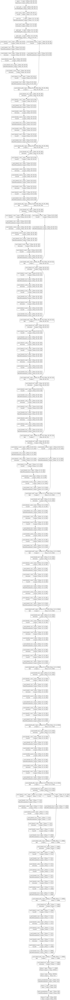

In [9]:
from tensorflow.keras.utils import plot_model
plot_model(embedding , 'model2.png' , show_shapes=True)

In [10]:
class DistanceLayer(tf.keras.layers.Layer):
    """
    This layer is responsible for computing the distance between the anchor
    embedding and the positive embedding, and the anchor embedding and the
    negative embedding.
    """

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)

anchor_input = Input(name="anchor", shape=TARGET_SHAPE)
positive_input = Input(name="positive", shape=TARGET_SHAPE)
negative_input = Input(name="negative", shape=TARGET_SHAPE)

distances = DistanceLayer()(embedding(resnet.preprocess_input(anchor_input)), embedding(resnet.preprocess_input(positive_input)), embedding(resnet.preprocess_input(negative_input)))

siamese_network = Model(inputs=[anchor_input, positive_input, negative_input], outputs=distances)

In [11]:
class SiameseModel(Model):
    """The Siamese Network model with a custom training and testing loops.

    Computes the triplet loss using the three embeddings produced by the
    Siamese Network.

    The triplet loss is defined as:
       L(A, P, N) = max(‖f(A) - f(P)‖² - ‖f(A) - f(N)‖² + margin, 0)
    """

    def __init__(self, siamese_network, margin=0.5):
        super(SiameseModel, self).__init__()
        self.siamese_network = siamese_network
        self.margin = margin
        self.loss_tracker = metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        ap_distance, an_distance = self.siamese_network(data)
        loss = ap_distance - an_distance
        loss = tf.maximum(loss + self.margin, 0.0)
        return loss

    @property
    def metrics(self):
        return [self.loss_tracker]

In [12]:
dataframe = pd.read_csv("../input/project2/foot_pairs.csv")
dataframe.negative.fillna(dataframe.negative.mode()[0], inplace=True)
dataframe

,anchor,positive,negative
0,embeddings_train_data\footwear\anchor\93deaa38...,embeddings_train_data\footwear\positive\4d29ac...,embeddings_train_data\footwear\positive\81f662...
1,embeddings_train_data\footwear\anchor\f1680c68...,embeddings_train_data\footwear\positive\fe16c8...,embeddings_train_data\footwear\positive\07b67d...
2,embeddings_train_data\footwear\anchor\1d43cf07...,embeddings_train_data\footwear\positive\8d5b6f...,embeddings_train_data\footwear\positive\ddad57...
3,embeddings_train_data\footwear\anchor\e3a0aba4...,embeddings_train_data\footwear\positive\713d34...,embeddings_train_data\footwear\positive\de078a...
4,embeddings_train_data\footwear\anchor\49033608...,embeddings_train_data\footwear\positive\e7d951...,embeddings_train_data\footwear\positive\c2dbe7...
...,...,...,...
8495,embeddings_train_data\footwear\anchor\2e8d2b03...,embeddings_train_data\footwear\positive\fa3a4c...,embeddings_train_data\footwear\positive\8e1861...
8496,embeddings_train_data\footwear\anchor\fe4ef8a4...,embeddings_train_data\footwear\positive\b32668...,embeddings_train_data\footwear\positive\b0b2c2...
8497,embeddings_train_data\footwear\anchor\f626ccb1...,embeddings_train_data\footwear\positive\ceff48...,embeddings_train_data\footwear\positive\00f0a3...
8498,embeddings_train_data\footwear\anchor\b238e64c...,embeddings_train_data\footwear\positive\cb4ba5...,embeddings_train_data\footwear\positive\c1649c...


In [13]:
to_add = '../input/project2/'
for column in dataframe.columns:
    dataframe[column] = dataframe[column].apply(lambda x: (to_add + x).replace("\\","/"))

anchor_images = dataframe.anchor.to_list()
positive_images = dataframe.positive.to_list()
negative_images = dataframe.negative.to_list()
image_count = len(anchor_images)

anchor_dataset = tf.data.Dataset.from_tensor_slices(anchor_images)
positive_dataset = tf.data.Dataset.from_tensor_slices(positive_images)
negative_dataset = tf.data.Dataset.from_tensor_slices(negative_images)

dataset = tf.data.Dataset.zip((anchor_dataset, positive_dataset, negative_dataset))
dataset = dataset.shuffle(buffer_size=1024)
dataset = dataset.map(preprocess_triplets)

train_dataset = dataset.take(round(image_count * 0.8))
val_dataset = dataset.skip(round(image_count * 0.8))

train_dataset = train_dataset.batch(BATCH_SIZE, drop_remainder=False)
train_dataset = train_dataset.prefetch(8)

val_dataset = val_dataset.batch(BATCH_SIZE, drop_remainder=False)
val_dataset = val_dataset.prefetch(8)

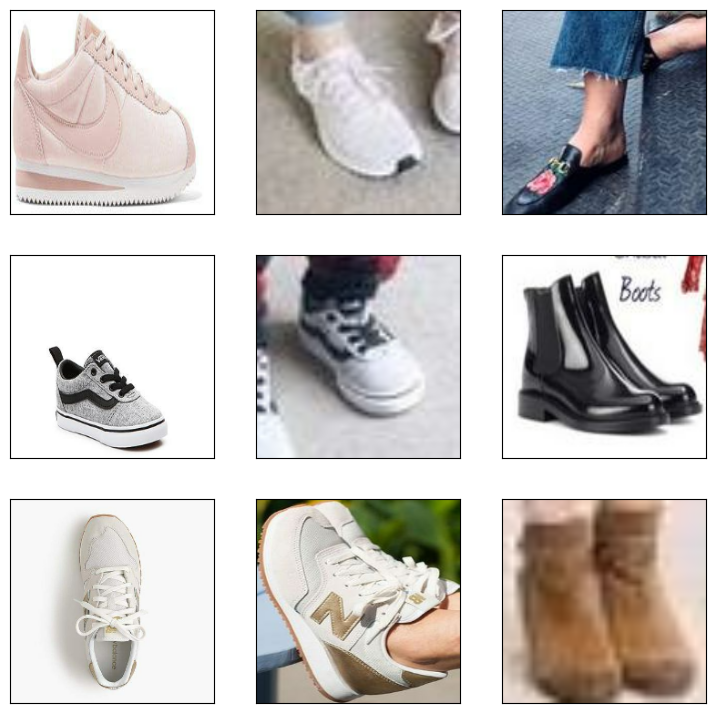

In [14]:
visualize(*list(train_dataset.take(1).as_numpy_iterator())[0])

In [15]:
callbacks = [EarlyStopping(monitor='val_loss', mode='min', patience=10, restore_best_weights=True)]

In [16]:
siamese_model = SiameseModel(siamese_network)
siamese_model.compile(optimizer=optimizers.Adam(LEARNING_RATE))
siamese_model.fit(train_dataset, epochs=EPOCHS, validation_data=val_dataset, callbacks=callbacks)

Epoch 1/20
213/213 [==============================] - 102s 362ms/step - loss: 0.5045 - val_loss: 0.4678
Epoch 2/20
213/213 [==============================] - 72s 337ms/step - loss: 0.4544 - val_loss: 0.4536
Epoch 3/20
213/213 [==============================] - 72s 337ms/step - loss: 0.4293 - val_loss: 0.4324
Epoch 4/20
213/213 [==============================] - 71s 335ms/step - loss: 0.3955 - val_loss: 0.4285
Epoch 5/20
213/213 [==============================] - 72s 339ms/step - loss: 0.3843 - val_loss: 0.4212
Epoch 6/20
213/213 [==============================] - 73s 341ms/step - loss: 0.3550 - val_loss: 0.4117
Epoch 7/20
213/213 [==============================] - 72s 337ms/step - loss: 0.3225 - val_loss: 0.4217
Epoch 8/20
213/213 [==============================] - 71s 336ms/step - loss: 0.3065 - val_loss: 0.4125
Epoch 9/20
213/213 [==============================] - 72s 339ms/step - loss: 0.2747 - val_loss: 0.4144
Epoch 10/20
213/213 [==============================] - 72s 336ms/step - 

In [17]:
sample = next(iter(train_dataset))
anchor, positive, negative = sample
anchor_embedding, positive_embedding, negative_embedding = (embedding(resnet.preprocess_input(anchor)), embedding(resnet.preprocess_input(positive)), embedding(resnet.preprocess_input(negative)),)

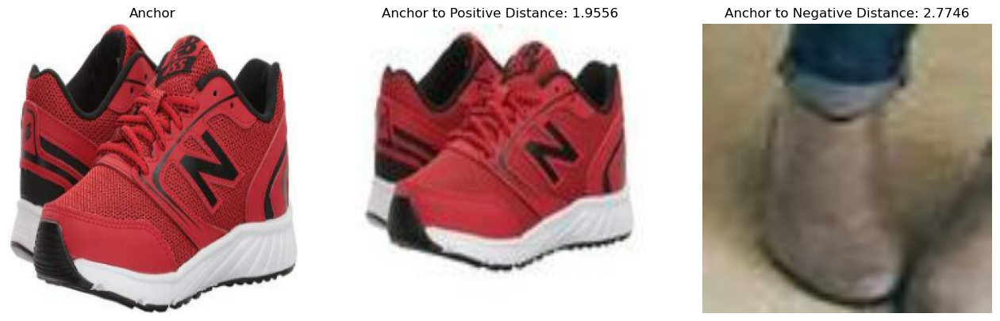

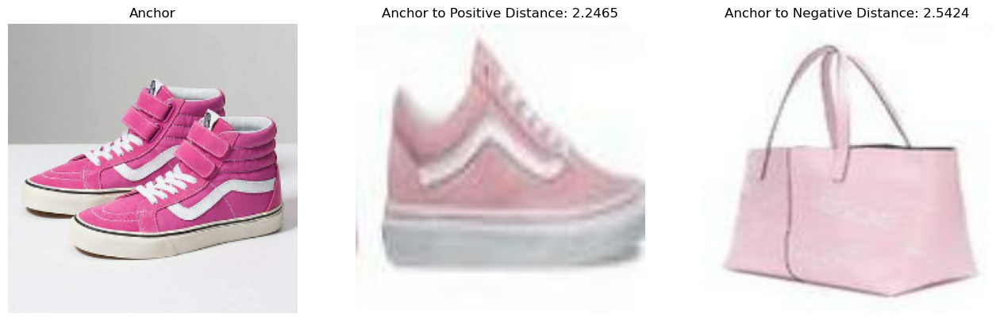

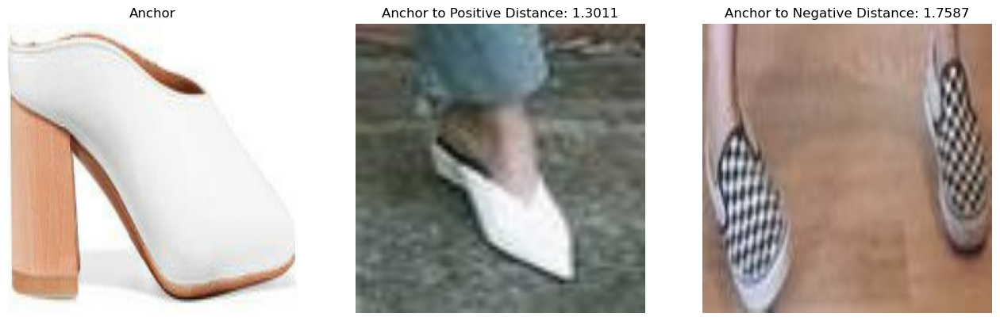

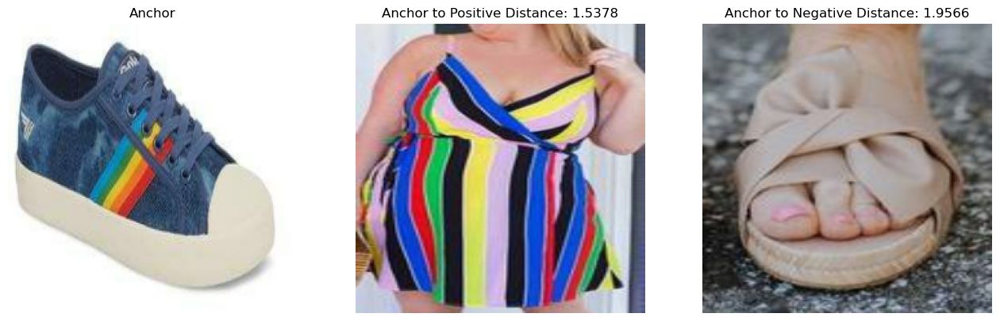

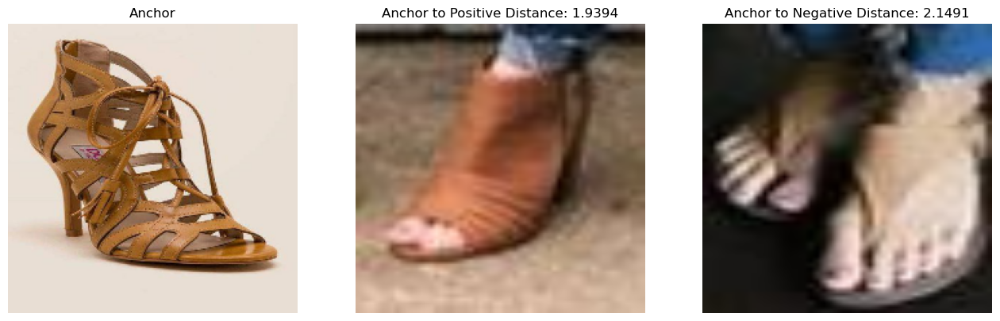

...

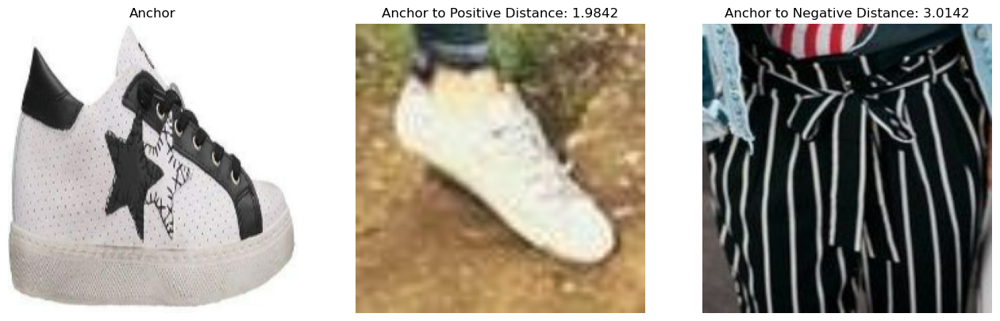

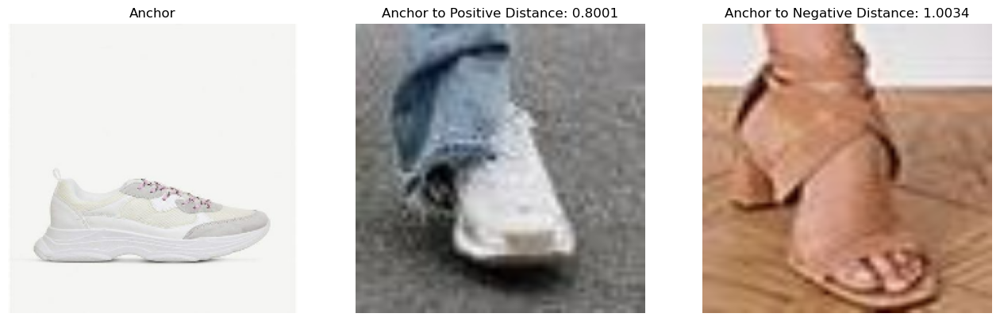

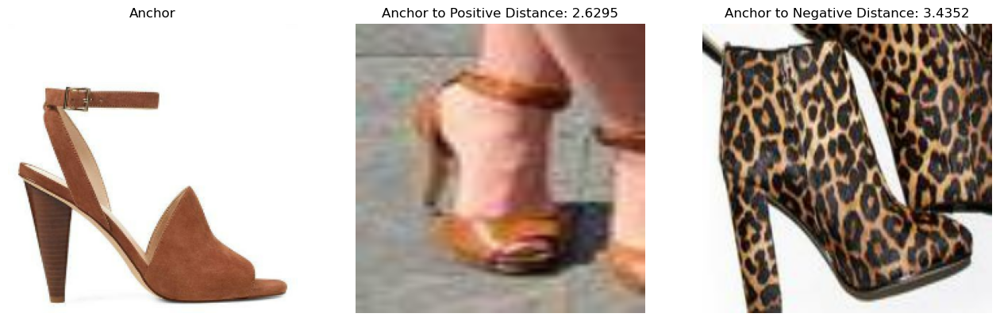

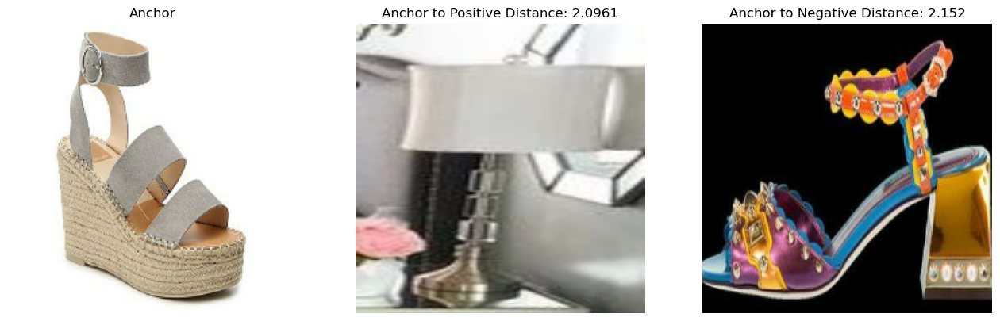

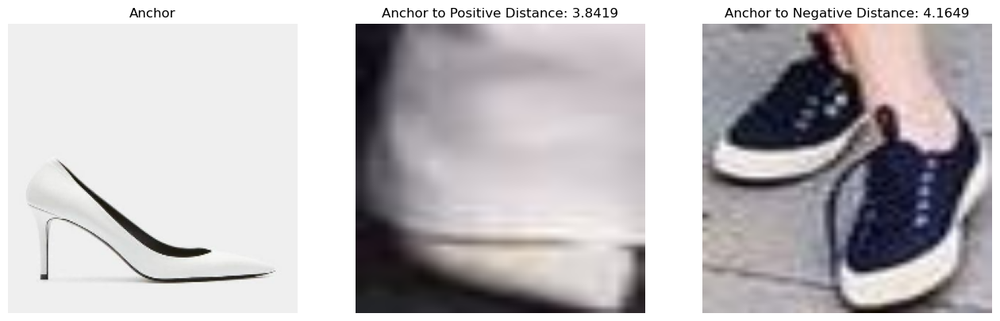

In [18]:
anchors, positives, negatives = sample
for i in range(len(anchor_embedding)):
    anchor, positive, negative = anchors[i], positives[i], negatives[i]
    positive_distance = np.linalg.norm(anchor_embedding[i] - positive_embedding[i], ord=2)*1e4
    negative_distance = np.linalg.norm(anchor_embedding[i] - negative_embedding[i], ord=2)*1e4
    positive_distance, negative_distance = round(positive_distance)/1e4, round(negative_distance)/1e4
    plt.figure(figsize=(16,9))
    plt.subplot(131)
    plt.imshow(anchor)
    plt.axis("off")
    plt.title("Anchor")
    plt.subplot(132)
    plt.imshow(positive)
    plt.axis("off")
    plt.title(f"Anchor to Positive Distance: {positive_distance}")
    plt.subplot(133)
    plt.imshow(negative)
    plt.axis("off")
    plt.title(f"Anchor to Negative Distance: {negative_distance}")
    plt.show()        

In [19]:
embedding.save("footwear_embedding.h5")